In [2]:
import os
import random
import shutil
import warnings
warnings.filterwarnings('ignore')

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import cv2

from PIL import Image
from pathlib import Path
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [4]:
# Plot style
sns.set_theme(style='darkgrid', palette='muted')
plt.rcParams['figure.dpi'] = 120
plt.rcParams['font.size'] = 11

## set Path

In [5]:
BASE_DIR = Path("archive")
IMG_DIR_1 = BASE_DIR/ 'HAM10000_images_part_1'         # part 1 images
IMG_DIR_2   = BASE_DIR / 'HAM10000_images_part_2'         # part 2 images
METADATA    = BASE_DIR / 'HAM10000_metadata.csv'          # CSV
OUTPUT_DIR  = Path('outputs')                              # where we save processed data
OUTPUT_DIR.mkdir(exist_ok=True)

In [6]:
for p in [IMG_DIR_1, IMG_DIR_2, METADATA]:
    status =  "present" if p.exists() else  "NOT FOUND"
    print(f'{status}  {p}')

present  archive/HAM10000_images_part_1
present  archive/HAM10000_images_part_2
present  archive/HAM10000_metadata.csv


# EDA

### Load Metadata

In [8]:
df= pd.read_csv(METADATA)

In [9]:
print('─' * 55)
print(f'  Total rows      : {len(df):,}')
print(f'  Total columns   : {df.shape[1]}')
print(f'  Unique lesions  : {df["lesion_id"].nunique():,}')
print(f'  Unique images   : {df["image_id"].nunique():,}')
print('─' * 55)

df.head(10)

───────────────────────────────────────────────────────
  Total rows      : 10,015
  Total columns   : 7
  Unique lesions  : 7,470
  Unique images   : 10,015
───────────────────────────────────────────────────────


,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear
5,HAM_0001466,ISIC_0027850,bkl,histo,75.0,male,ear
6,HAM_0002761,ISIC_0029176,bkl,histo,60.0,male,face
7,HAM_0002761,ISIC_0029068,bkl,histo,60.0,male,face
8,HAM_0005132,ISIC_0025837,bkl,histo,70.0,female,back
9,HAM_0005132,ISIC_0025209,bkl,histo,70.0,female,back


In [10]:
print("\n DataFrame Info:")
print(df.info())
print("\n")
print(df.describe)



 DataFrame Info:
<class 'pandas.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  str    
 1   image_id      10015 non-null  str    
 2   dx            10015 non-null  str    
 3   dx_type       10015 non-null  str    
 4   age           9958 non-null   float64
 5   sex           10015 non-null  str    
 6   localization  10015 non-null  str    
dtypes: float64(1), str(6)
memory usage: 547.8 KB
None


<bound method NDFrame.describe of          lesion_id      image_id     dx dx_type   age     sex localization
0      HAM_0000118  ISIC_0027419    bkl   histo  80.0    male        scalp
1      HAM_0000118  ISIC_0025030    bkl   histo  80.0    male        scalp
2      HAM_0002730  ISIC_0026769    bkl   histo  80.0    male        scalp
3      HAM_0002730  ISIC_0025661    bkl   histo  80.0    male        scalp
4      HAM_0001466  ISIC_0031633

In [11]:
df.isnull().sum()

lesion_id        0
image_id         0
dx               0
dx_type          0
age             57
sex              0
localization     0
dtype: int64

### Missing Values

In [12]:
missing = df.isnull().sum()
missing_pct = (df.isnull().sum() / len(df)) * 100
missing_df = pd.DataFrame({
    'Missing Count': missing,
    'Missing %'    : missing_pct.round(2)
}).query('`Missing Count` > 0')

print('\n Missing Values:')
print(missing_df if not missing_df.empty else 'No missing values found')


 Missing Values:
     Missing Count  Missing %
age             57       0.57


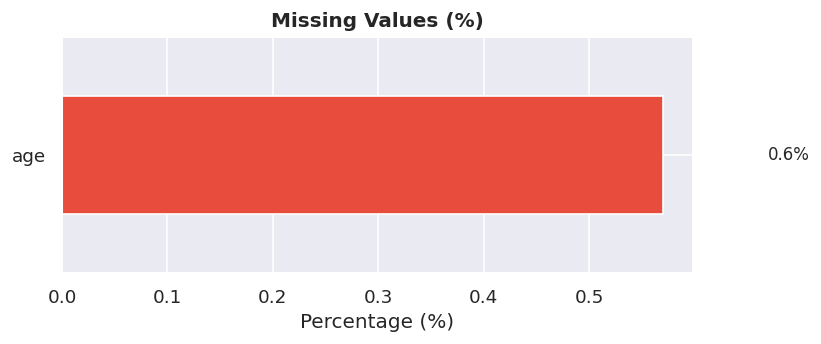

In [13]:
if not missing_df.empty:
    fig, ax = plt.subplots(figsize=(7, 3))
    missing_df['Missing %'].plot(kind='barh', ax=ax, color='#e74c3c', edgecolor='white')
    ax.set_title('Missing Values (%)', fontweight='bold')
    ax.set_xlabel('Percentage (%)')
    for i, v in enumerate(missing_df['Missing %']):
        ax.text(v + 0.1, i, f'{v:.1f}%', va='center', fontsize=10)
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'eda_missing_values.png', bbox_inches='tight')
    plt.show()

In [15]:
CLASS_NAMES = {
    'nv'   : 'Melanocytic Nevi',
    'mel'  : 'Melanoma',
    'bkl'  : 'Benign Keratosis',
    'bcc'  : 'Basal Cell Carcinoma',
    'akiec': 'Actinic Keratosis',
    'vasc' : 'Vascular Lesions',
    'df'   : 'Dermatofibroma'
}

In [16]:
class_counts = df['dx'].value_counts()
class_pct    = (class_counts / len(df) * 100).round(1)

In [17]:
print(class_counts)
print(class_pct)

dx
nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: count, dtype: int64
dx
nv       66.9
mel      11.1
bkl      11.0
bcc       5.1
akiec     3.3
vasc      1.4
df        1.1
Name: count, dtype: float64


In [18]:
print('\n Class Distribution:')

for cls, cnt in class_counts.items():
    bar = '█' * int(cnt / 100)
    print(f'  {cls:<7} {CLASS_NAMES[cls]:<28} {cnt:>5}  ({class_pct[cls]:>5.1f}%)  {bar}')


 Class Distribution:
  nv      Melanocytic Nevi              6705  ( 66.9%)  ███████████████████████████████████████████████████████████████████
  mel     Melanoma                      1113  ( 11.1%)  ███████████
  bkl     Benign Keratosis              1099  ( 11.0%)  ██████████
  bcc     Basal Cell Carcinoma           514  (  5.1%)  █████
  akiec   Actinic Keratosis              327  (  3.3%)  ███
  vasc    Vascular Lesions               142  (  1.4%)  █
  df      Dermatofibroma                 115  (  1.1%)  █


In [19]:
CLASS_COLORS = ['#3498db','#e74c3c','#2ecc71','#f39c12','#9b59b6','#1abc9c','#e67e22']

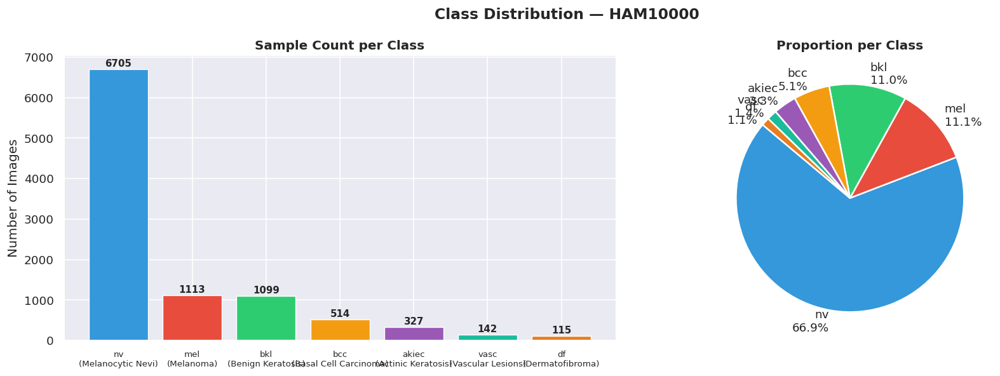

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Class Distribution — HAM10000', fontsize=14, fontweight='bold')
# Bar chart
labels = [f"{k}\n({CLASS_NAMES[k]})" for k in class_counts.index]
bars = axes[0].bar(labels, class_counts.values, color=CLASS_COLORS, edgecolor='white', linewidth=0.8)
axes[0].set_title('Sample Count per Class', fontweight='bold')
axes[0].set_ylabel('Number of Images')
axes[0].tick_params(axis='x', labelsize=8)
for bar, cnt in zip(bars, class_counts.values):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 20,
                 str(cnt), ha='center', va='bottom', fontsize=9, fontweight='bold')


# Pie chart
wedge_labels = [f"{k}\n{class_pct[k]:.1f}%" for k in class_counts.index]
axes[1].pie(class_counts.values, labels=wedge_labels, colors=CLASS_COLORS,
            autopct='', startangle=140, pctdistance=0.85,
            wedgeprops=dict(edgecolor='white', linewidth=1.5))
axes[1].set_title('Proportion per Class', fontweight='bold')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'eda_class_distribution.png', bbox_inches='tight')
plt.show()

In [21]:
imbalance_ratio = class_counts.max() / class_counts.min()
print(f'\n Imbalance Ratio (max/min): {imbalance_ratio:.1f}x  — Significant imbalance detected!')


 Imbalance Ratio (max/min): 58.3x  — Significant imbalance detected!


### Duplicate Image

In [22]:
lesion_counts = df.groupby('lesion_id')['image_id'].count()
dup_lesions   = lesion_counts[lesion_counts > 1]
print(f'Total unique lesion IDs         : {lesion_counts.shape[0]:,}')
print(f'Lesions with multiple images    : {len(dup_lesions):,}')
print(f'Images from duplicate lesions   : {dup_lesions.sum():,}')
print(f'Max images for one lesion       : {lesion_counts.max()}')

Total unique lesion IDs         : 7,470
Lesions with multiple images    : 1,956
Images from duplicate lesions   : 4,501
Max images for one lesion       : 6


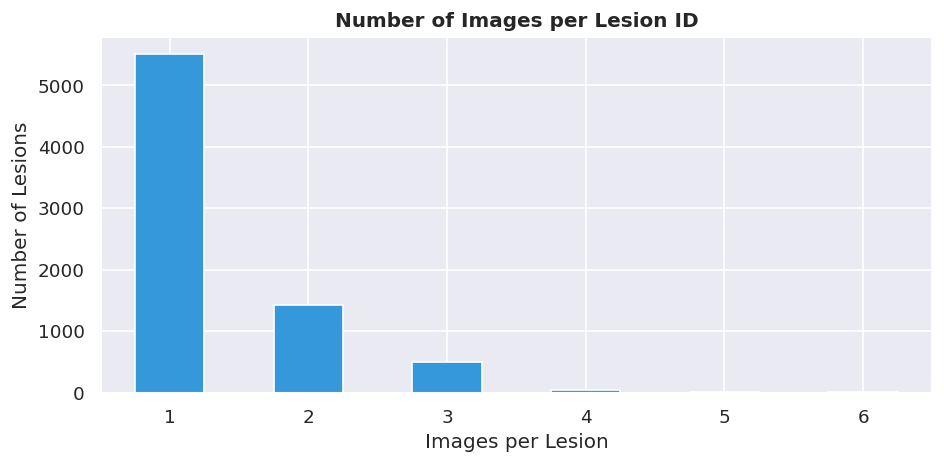

In [23]:
fig, ax = plt.subplots(figsize=(8, 4))
lesion_counts.value_counts().sort_index().plot(kind='bar', ax=ax, color='#3498db', edgecolor='white')
ax.set_title('Number of Images per Lesion ID', fontweight='bold')
ax.set_xlabel('Images per Lesion')
ax.set_ylabel('Number of Lesions')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'eda_duplicate_lesions.png', bbox_inches='tight')
plt.show()

### Age Distribution

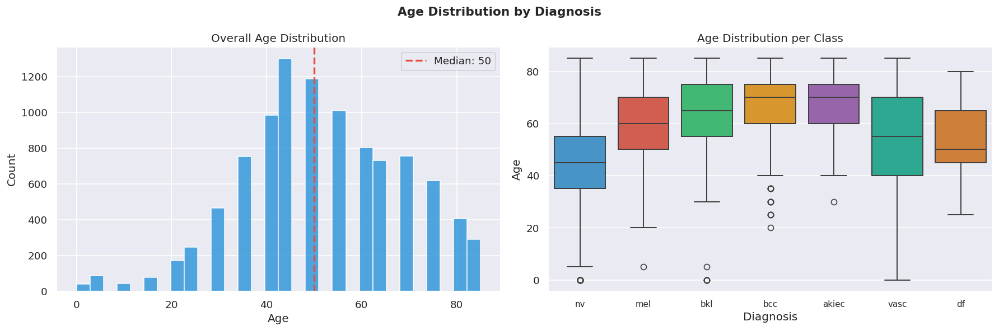

In [24]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Age Distribution by Diagnosis', fontsize=13, fontweight='bold')

# Histogram overall
axes[0].hist(df['age'].dropna(), bins=30, color='#3498db', edgecolor='white', alpha=0.85)
axes[0].axvline(df['age'].median(), color='#e74c3c', linestyle='--', linewidth=2, label=f'Median: {df["age"].median():.0f}')
axes[0].set_title('Overall Age Distribution')
axes[0].set_xlabel('Age')
axes[0].set_ylabel('Count')
axes[0].legend()

# Boxplot per class
order = class_counts.index.tolist()
sns.boxplot(data=df, x='dx', y='age', order=order,
            palette=CLASS_COLORS, ax=axes[1], linewidth=1.2)
axes[1].set_title('Age Distribution per Class')
axes[1].set_xlabel('Diagnosis')
axes[1].set_ylabel('Age')
axes[1].tick_params(axis='x', labelsize=9)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'eda_age_distribution.png', bbox_inches='tight')
plt.show()

### Sex Distribution per class

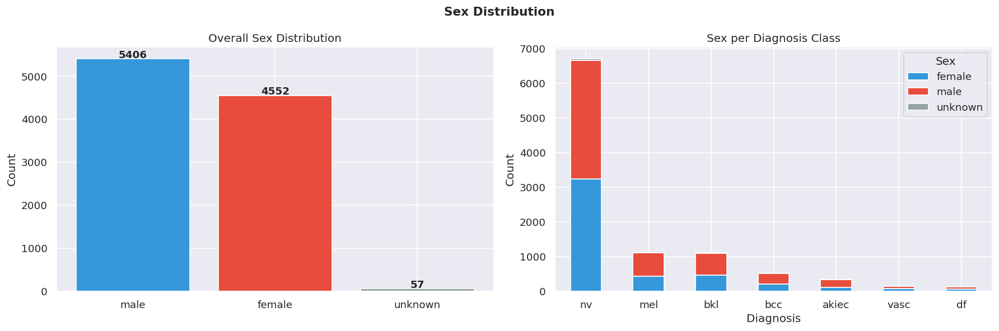

In [27]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Sex Distribution', fontsize=13, fontweight='bold')

# Overall sex
sex_counts = df['sex'].value_counts()
axes[0].bar(sex_counts.index, sex_counts.values,
            color=['#3498db','#e74c3c','#95a5a6'], edgecolor='white')
axes[0].set_title('Overall Sex Distribution')
axes[0].set_ylabel('Count')
for i, v in enumerate(sex_counts.values):
    axes[0].text(i, v + 20, str(v), ha='center', fontweight='bold')

# Sex per class — stacked bar
sex_class = df.groupby(['dx','sex']).size().unstack(fill_value=0)
sex_class = sex_class.loc[order] if set(order).issubset(sex_class.index) else sex_class
sex_class.plot(kind='bar', ax=axes[1], stacked=True,
               color=['#3498db','#e74c3c','#95a5a6'], edgecolor='white')
axes[1].set_title('Sex per Diagnosis Class')
axes[1].set_xlabel('Diagnosis')
axes[1].set_ylabel('Count')
axes[1].tick_params(axis='x', rotation=0)
axes[1].legend(title='Sex')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'eda_sex_distribution.png', bbox_inches='tight')
plt.show()

### Localization Distribution

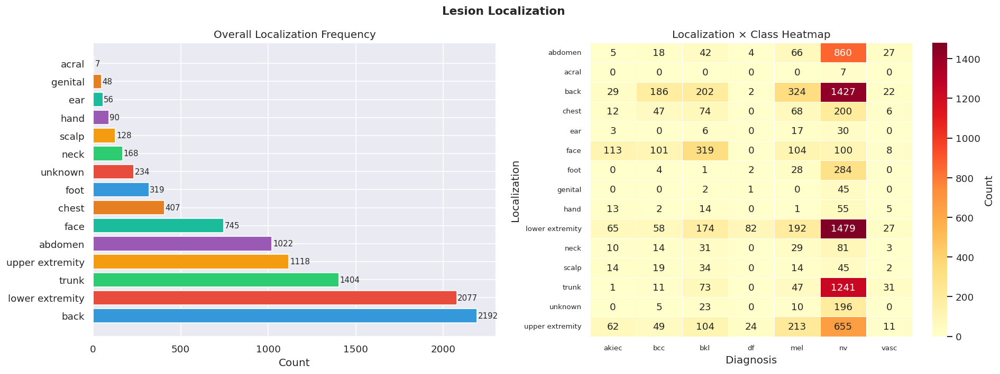

In [30]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Lesion Localization', fontsize=13, fontweight='bold')

# Overall
loc_counts = df['localization'].value_counts()
#colors_loc = plt.cm.Set3(np.linspace(0, 1, len(loc_counts)))
axes[0].barh(loc_counts.index, loc_counts.values, color=CLASS_COLORS, edgecolor='white')
axes[0].set_title('Overall Localization Frequency')
axes[0].set_xlabel('Count')
for i, v in enumerate(loc_counts.values):
    axes[0].text(v + 5, i, str(v), va='center', fontsize=9)

# Heatmap: localization × class
loc_class = df.groupby(['localization','dx']).size().unstack(fill_value=0)
sns.heatmap(loc_class, annot=True, fmt='d', cmap='YlOrRd',
            ax=axes[1], linewidths=0.5, linecolor='white',
            cbar_kws={'label': 'Count'})
axes[1].set_title('Localization × Class Heatmap')
axes[1].set_xlabel('Diagnosis')
axes[1].set_ylabel('Localization')
axes[1].tick_params(axis='x', labelsize=8)
axes[1].tick_params(axis='y', labelsize=8)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'eda_localization.png', bbox_inches='tight')
plt.show()

### Diagnosis type(dx_type) distribution

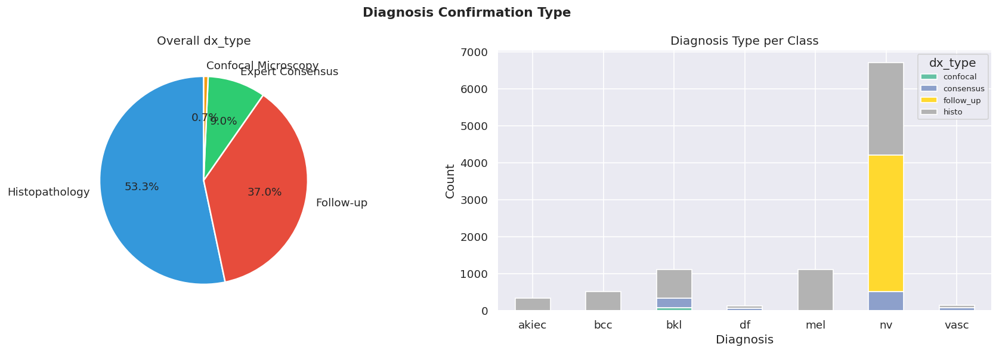

In [31]:
DX_TYPE_NAMES = {
    'histo'  : 'Histopathology',
    'follow_up': 'Follow-up',
    'consensus': 'Expert Consensus',
    'confocal' : 'Confocal Microscopy'
}

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Diagnosis Confirmation Type', fontsize=13, fontweight='bold')

# Overall
dxt_counts = df['dx_type'].value_counts()
axes[0].pie(dxt_counts.values,
            labels=[DX_TYPE_NAMES.get(k, k) for k in dxt_counts.index],
            autopct='%1.1f%%', colors=CLASS_COLORS[:len(dxt_counts)],
            wedgeprops=dict(edgecolor='white', linewidth=1.5), startangle=90)
axes[0].set_title('Overall dx_type')

# Per class
dxt_class = df.groupby(['dx','dx_type']).size().unstack(fill_value=0)
dxt_class.plot(kind='bar', ax=axes[1], stacked=True,
               colormap='Set2', edgecolor='white')
axes[1].set_title('Diagnosis Type per Class')
axes[1].set_xlabel('Diagnosis')
axes[1].set_ylabel('Count')
axes[1].tick_params(axis='x', rotation=0)
axes[1].legend(title='dx_type', fontsize=8)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'eda_dx_type.png', bbox_inches='tight')
plt.show()

In [32]:
image_path_map = {}
for folder in [IMG_DIR_1, IMG_DIR_2]:
    for img_path in folder.glob('*.jpg'):
        image_path_map[img_path.stem] = str(img_path)

print(f'Total images found in both folders : {len(image_path_map):,}')

# Add path column to dataframe
df['image_path'] = df['image_id'].map(image_path_map)
missing_images   = df['image_path'].isnull().sum()
print(f' Images missing from disk: {missing_images}')

# Drop rows with no image file
df = df.dropna(subset=['image_path'])
print(f'Rows after dropping missing images : {len(df):,}')

Total images found in both folders : 10,015
 Images missing from disk: 0
Rows after dropping missing images : 10,015


In [33]:
df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,image_path
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,archive/HAM10000_images_part_1/ISIC_0027419.jpg
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,archive/HAM10000_images_part_1/ISIC_0025030.jpg
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,archive/HAM10000_images_part_1/ISIC_0026769.jpg
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,archive/HAM10000_images_part_1/ISIC_0025661.jpg
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,archive/HAM10000_images_part_2/ISIC_0031633.jpg


### Sample Image per class

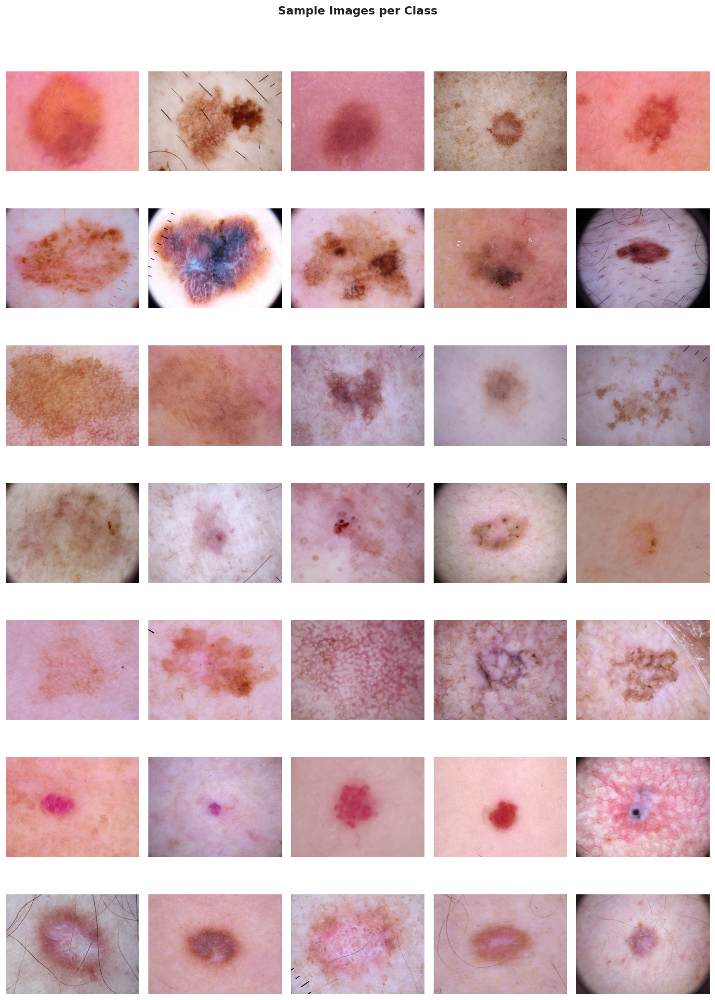

In [37]:
N_SAMPLES = 5
classes   = list(CLASS_NAMES.keys())

fig, axes = plt.subplots(len(classes), N_SAMPLES, figsize=(N_SAMPLES * 2.5, len(classes) * 2.5))
fig.suptitle('Sample Images per Class', fontsize=14, fontweight='bold', y=1.01)

for row_idx, cls in enumerate(classes):
    samples = df[df['dx'] == cls].sample(N_SAMPLES, random_state=42)
    for col_idx, (_, row) in enumerate(samples.iterrows()):
        img = Image.open(row['image_path']).convert('RGB')
        axes[row_idx, col_idx].imshow(img)
        axes[row_idx, col_idx].axis('off')
        if col_idx == 0:
            axes[row_idx, col_idx].set_ylabel(
                f"{cls}\n{CLASS_NAMES[cls]}",
                fontsize=8, fontweight='bold', rotation=0,
                ha='right', va='center', labelpad=60
            )

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'eda_sample_images.png', bbox_inches='tight')
plt.show()

### Image Size

Width  — min: 600, max: 600, mean: 600
Height — min: 450, max: 450, mean: 450


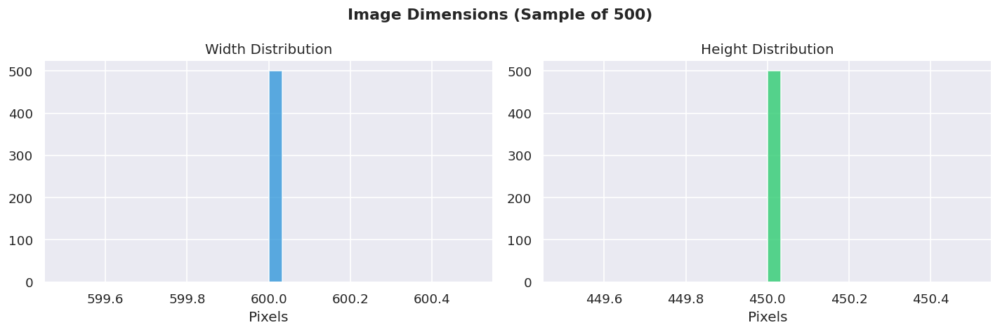

In [38]:
sample_paths = df['image_path'].sample(500, random_state=42).tolist()

widths, heights = [], []
for path in sample_paths:
    try:
        with Image.open(path) as img:
            w, h = img.size
            widths.append(w)
            heights.append(h)
    except:
        pass

print(f'Width  — min: {min(widths)}, max: {max(widths)}, mean: {np.mean(widths):.0f}')
print(f'Height — min: {min(heights)}, max: {max(heights)}, mean: {np.mean(heights):.0f}')

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
fig.suptitle('Image Dimensions (Sample of 500)', fontweight='bold')

axes[0].hist(widths,  bins=30, color='#3498db', edgecolor='white', alpha=0.8)
axes[0].set_title('Width Distribution')
axes[0].set_xlabel('Pixels')

axes[1].hist(heights, bins=30, color='#2ecc71', edgecolor='white', alpha=0.8)
axes[1].set_title('Height Distribution')
axes[1].set_xlabel('Pixels')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'eda_image_sizes.png', bbox_inches='tight')
plt.show()

### Pixel intensity 

 Channel Statistics (mean ± std across 200 images):
  R: mean=0.7560 | std=0.0862
  G: mean=0.5551 | std=0.1130
  B: mean=0.5822 | std=0.1290


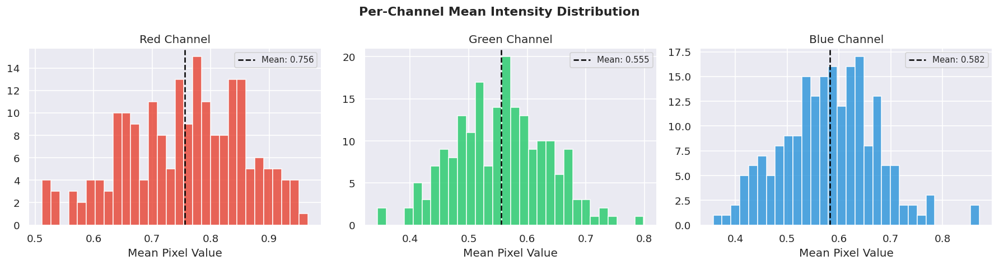

In [39]:
sample_paths_px = df['image_path'].sample(200, random_state=42).tolist()

r_means, g_means, b_means = [], [], []
r_stds,  g_stds,  b_stds  = [], [], []

for path in sample_paths_px:
    try:
        img = np.array(Image.open(path).convert('RGB')) / 255.0
        r_means.append(img[:,:,0].mean()); r_stds.append(img[:,:,0].std())
        g_means.append(img[:,:,1].mean()); g_stds.append(img[:,:,1].std())
        b_means.append(img[:,:,2].mean()); b_stds.append(img[:,:,2].std())
    except:
        pass

print(' Channel Statistics (mean ± std across 200 images):')
print(f'  R: mean={np.mean(r_means):.4f} | std={np.mean(r_stds):.4f}')
print(f'  G: mean={np.mean(g_means):.4f} | std={np.mean(g_stds):.4f}')
print(f'  B: mean={np.mean(b_means):.4f} | std={np.mean(b_stds):.4f}')

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
fig.suptitle('Per-Channel Mean Intensity Distribution', fontweight='bold')

for ax, means, color, ch in zip(axes,
                                  [r_means, g_means, b_means],
                                  ['#e74c3c','#2ecc71','#3498db'],
                                  ['Red','Green','Blue']):
    ax.hist(means, bins=30, color=color, edgecolor='white', alpha=0.85)
    ax.axvline(np.mean(means), color='black', linestyle='--', linewidth=1.5,
               label=f'Mean: {np.mean(means):.3f}')
    ax.set_title(f'{ch} Channel')
    ax.set_xlabel('Mean Pixel Value')
    ax.legend(fontsize=9)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'eda_pixel_channels.png', bbox_inches='tight')
plt.show()

# Preprocessing

### Fixing Missing values

In [40]:
print('Before imputation:')
print(df[['age','sex','localization']].isnull().sum())

# Age: with median
df['age'] = df.groupby('dx')['age'].transform(lambda x: x.fillna(x.median()))

# Sex & localization: with mode
df['sex']          = df['sex'].fillna(df['sex'].mode()[0])
df['localization'] = df['localization'].fillna(df['localization'].mode()[0])

print('\nAfter imputation:')
print(df[['age','sex','localization']].isnull().sum())
print('\nMissing values handled.')

Before imputation:
age             57
sex              0
localization     0
dtype: int64

After imputation:
age             0
sex             0
localization    0
dtype: int64

Missing values handled.


### Encode Label

In [42]:
# encoding string labels to integer

le = LabelEncoder()
df['label'] = le.fit_transform(df['dx'])

# Class index mapping
CLASS_TO_IDX = {cls: idx for idx, cls in enumerate(le.classes_)}
IDX_TO_CLASS = {v: k for k, v in CLASS_TO_IDX.items()}

print('Class → Index Mapping:')
for cls, idx in CLASS_TO_IDX.items():
    print(f'  [{idx}]  {cls:<8}  →  {CLASS_NAMES[cls]}')

NUM_CLASSES = len(CLASS_TO_IDX)
print(f'\n {NUM_CLASSES} classes encoded.')

Class → Index Mapping:
  [0]  akiec     →  Actinic Keratosis
  [1]  bcc       →  Basal Cell Carcinoma
  [2]  bkl       →  Benign Keratosis
  [3]  df        →  Dermatofibroma
  [4]  mel       →  Melanoma
  [5]  nv        →  Melanocytic Nevi
  [6]  vasc      →  Vascular Lesions

 7 classes encoded.


### Train test split

In [43]:
SEED = 42


# Get unique lesion_ids with their class
lesion_df = df.drop_duplicates(subset='lesion_id')[['lesion_id','label']]

# First split: 80% train, 20% temp (val+test)
train_lesions, temp_lesions = train_test_split(
    lesion_df['lesion_id'],
    test_size=0.2,
    stratify=lesion_df['label'],
    random_state=SEED
)

# Second split: 50/50 on temp → 10% val, 10% test
temp_df = lesion_df[lesion_df['lesion_id'].isin(temp_lesions)]
val_lesions, test_lesions = train_test_split(
    temp_df['lesion_id'],
    test_size=0.5,
    stratify=temp_df['label'],
    random_state=SEED
)

# Assign split to full dataframe
df['split'] = 'train'
df.loc[df['lesion_id'].isin(val_lesions),   'split'] = 'val'
df.loc[df['lesion_id'].isin(test_lesions),  'split'] = 'test'

train_df = df[df['split'] == 'train'].reset_index(drop=True)
val_df   = df[df['split'] == 'val'].reset_index(drop=True)
test_df  = df[df['split'] == 'test'].reset_index(drop=True)

print(f'Train  : {len(train_df):>5} images  ({len(train_df)/len(df)*100:.1f}%)')
print(f'Val    : {len(val_df):>5} images  ({len(val_df)/len(df)*100:.1f}%)')
print(f'Test   : {len(test_df):>5} images  ({len(test_df)/len(df)*100:.1f}%)')
print(f'Total  : {len(df):>5} images')

# Verify no lesion leakage
assert len(set(train_df['lesion_id']) & set(val_df['lesion_id']))  == 0, 'Leakage: train/val'
assert len(set(train_df['lesion_id']) & set(test_df['lesion_id'])) == 0, 'Leakage: train/test'
assert len(set(val_df['lesion_id'])   & set(test_df['lesion_id'])) == 0, 'Leakage: val/test'
print('\n No data leakage — splits are clean.')

Train  :  8020 images  (80.1%)
Val    :  1019 images  (10.2%)
Test   :   976 images  (9.7%)
Total  : 10015 images

 No data leakage — splits are clean.


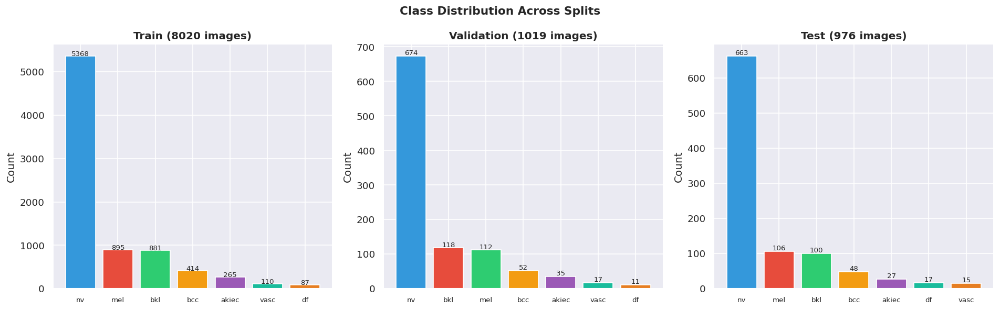

In [134]:
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle('Class Distribution Across Splits', fontsize=13, fontweight='bold')

for ax, split_df, split_name in zip(
    axes,
    [train_df, val_df, test_df],
    ['Train', 'Validation', 'Test']
):
    counts = split_df['dx'].value_counts()
    ax.bar(counts.index, counts.values, color=CLASS_COLORS[:len(counts)], edgecolor='white')
    ax.set_title(f'{split_name} ({len(split_df)} images)', fontweight='bold')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', labelsize=8)
    for bar, v in zip(ax.patches, counts.values):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 3,
                str(v), ha='center', fontsize=8)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'preprocessing_split_distribution.png', bbox_inches='tight')
plt.show()

### Class Weights for Loss Function

Class Weights for CrossEntropyLoss:
────────────────────────────────────────
  [0] akiec    Actinic Keratosis            weight = 4.3235
  [1] bcc      Basal Cell Carcinoma         weight = 2.7674
  [2] bkl      Benign Keratosis             weight = 1.3005
  [3] df       Dermatofibroma               weight = 13.1691
  [4] mel      Melanoma                     weight = 1.2801
  [5] nv       Melanocytic Nevi             weight = 0.2134
  [6] vasc     Vascular Lesions             weight = 10.4156


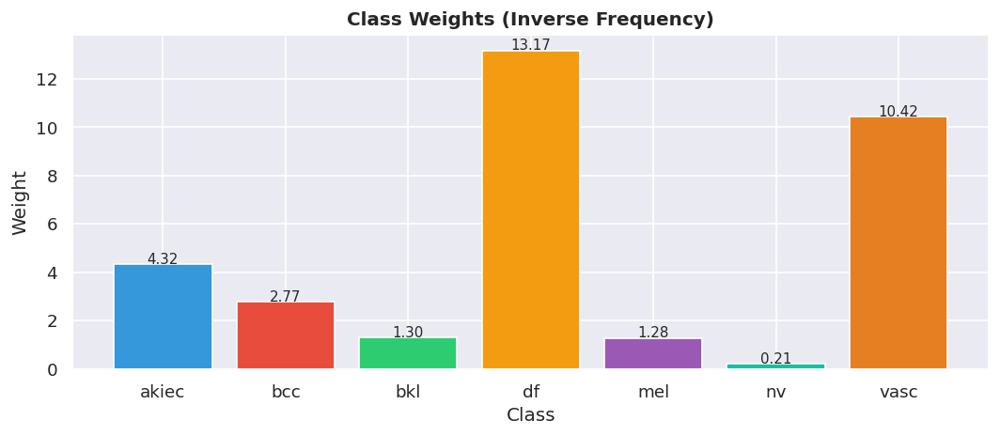

In [136]:
import torch

# Compute inverse-frequency class weights
class_counts_train = train_df['label'].value_counts().sort_index()
total_train        = len(train_df)

# Weight = total / (num_classes * class_count)
class_weights = total_train / (NUM_CLASSES * class_counts_train)
class_weights_tensor = torch.FloatTensor(class_weights.values)

print('Class Weights for CrossEntropyLoss:')
print('─' * 40)
for idx, w in enumerate(class_weights_tensor):
    cls = IDX_TO_CLASS[idx]
    print(f'  [{idx}] {cls:<8} {CLASS_NAMES[cls]:<28} weight = {w:.4f}')

# Visualize
fig, ax = plt.subplots(figsize=(9, 4))
labels_w = [IDX_TO_CLASS[i] for i in range(NUM_CLASSES)]
ax.bar(labels_w, class_weights_tensor.numpy(), color=CLASS_COLORS, edgecolor='white')
ax.set_title('Class Weights (Inverse Frequency)', fontweight='bold')
ax.set_ylabel('Weight')
ax.set_xlabel('Class')
for bar, w in zip(ax.patches, class_weights_tensor.numpy()):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
            f'{w:.2f}', ha='center', fontsize=9)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'preprocessing_class_weights.png', bbox_inches='tight')
plt.show()

In [138]:
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

In [140]:
# Assign a sample weight to each training image
sample_weights = class_weights[train_df['label'].values].values
sampler = WeightedRandomSampler(
    weights     = torch.DoubleTensor(sample_weights),
    num_samples = len(train_df),
    replacement = True
)

print(' WeightedRandomSampler created.')
print(f'   num_samples : {len(train_df):,}')
print('This ensures minority classes are seen more frequently during training.')

 WeightedRandomSampler created.
   num_samples : 8,020
This ensures minority classes are seen more frequently during training.


### Augmentation

In [143]:
IMG_SIZE = 224   # standard for pretrained CNNs (EfficientNet, ResNet)

# ImageNet normalization stats
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

# TRAIN — with augmentation 
train_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=20),
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2,
        hue=0.1
    ),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

# val-test
val_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

print('Transforms defined.')
print(f'   Image size : {IMG_SIZE}×{IMG_SIZE}')
print(f'   Normalize  : mean={IMAGENET_MEAN}, std={IMAGENET_STD}')

Transforms defined.
   Image size : 224×224
   Normalize  : mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]


### Visualize Agumented Image

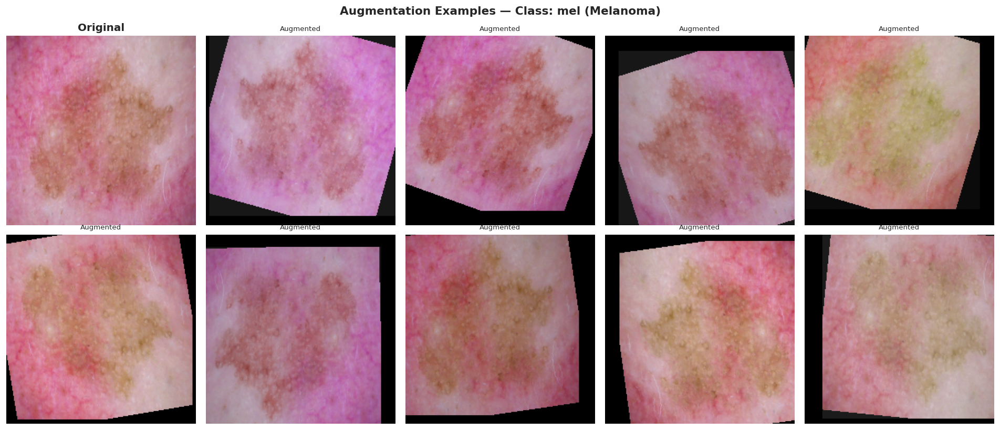

In [144]:
def denormalize(tensor, mean=IMAGENET_MEAN, std=IMAGENET_STD):
    """Reverse normalization for visualization."""
    t = tensor.clone()
    for c, (m, s) in enumerate(zip(mean, std)):
        t[c] = t[c] * s + m
    return t.clamp(0, 1)

# Pick one sample image and apply augmentation 8 times
sample_row  = df.sample(1, random_state=SEED).iloc[0]
sample_img  = Image.open(sample_row['image_path']).convert('RGB')

fig, axes = plt.subplots(2, 5, figsize=(16, 7))
fig.suptitle(f'Augmentation Examples — Class: {sample_row["dx"]} ({CLASS_NAMES[sample_row["dx"]]})',
             fontsize=13, fontweight='bold')

# Original (first)
axes[0, 0].imshow(sample_img.resize((IMG_SIZE, IMG_SIZE)))
axes[0, 0].set_title('Original', fontweight='bold')
axes[0, 0].axis('off')

# 9 augmented versions
flat_axes = [axes[i, j] for i in range(2) for j in range(5)][1:]
for ax in flat_axes:
    aug_tensor = train_transforms(sample_img)
    aug_img    = denormalize(aug_tensor).permute(1, 2, 0).numpy()
    ax.imshow(aug_img)
    ax.set_title('Augmented', fontsize=8)
    ax.axis('off')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'preprocessing_augmentation.png', bbox_inches='tight')
plt.show()

# Pytorch Dataset

In [145]:
class HAM10000Dataset(Dataset):
   
    def __init__(self, dataframe, transform=None):
        self.df        = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row   = self.df.iloc[idx]
        img   = Image.open(row['image_path']).convert('RGB')
        label = int(row['label'])

        if self.transform:
            img = self.transform(img)

        return img, label

    def get_class_name(self, label_idx):
        return CLASS_NAMES[IDX_TO_CLASS[label_idx]]

print('HAM10000Dataset class defined.')

HAM10000Dataset class defined.


### Create Dataloaders

In [146]:
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)


In [147]:
BATCH_SIZE  = 32
NUM_WORKERS = 4    

# Datasets
train_dataset = HAM10000Dataset(train_df, transform=train_transforms)
val_dataset   = HAM10000Dataset(val_df,   transform=val_transforms)
test_dataset  = HAM10000Dataset(test_df,  transform=val_transforms)

# DataLoaders
train_loader = DataLoader(
    train_dataset,
    batch_size  = BATCH_SIZE,
    sampler     = sampler,         # WeightedRandomSampler
    num_workers = NUM_WORKERS,
    pin_memory  = True
)

val_loader = DataLoader(
    val_dataset,
    batch_size  = BATCH_SIZE,
    shuffle     = False,
    num_workers = NUM_WORKERS,
    pin_memory  = True
)

test_loader = DataLoader(
    test_dataset,
    batch_size  = BATCH_SIZE,
    shuffle     = False,
    num_workers = NUM_WORKERS,
    pin_memory  = True
)

print(f' DataLoaders created.')
print(f'   Batch size   : {BATCH_SIZE}')
print(f'   Train batches: {len(train_loader)}')
print(f'   Val batches  : {len(val_loader)}')
print(f'   Test batches : {len(test_loader)}')

 DataLoaders created.
   Batch size   : 32
   Train batches: 251
   Val batches  : 32
   Test batches : 31


### Verify batch

Batch image tensor shape : torch.Size([32, 3, 224, 224])  (B, C, H, W)
Batch label tensor shape : torch.Size([32])
Image dtype              : torch.float32
Label dtype              : torch.int64
Pixel min / max          : -2.118 / 2.640
Labels in batch          : [2, 2, 2, 6, 6, 0, 0, 2, 2, 3, 4, 5, 0, 4, 1, 2, 1, 1, 6, 2, 1, 4, 4, 2, 2, 0, 3, 3, 2, 3, 3, 3]


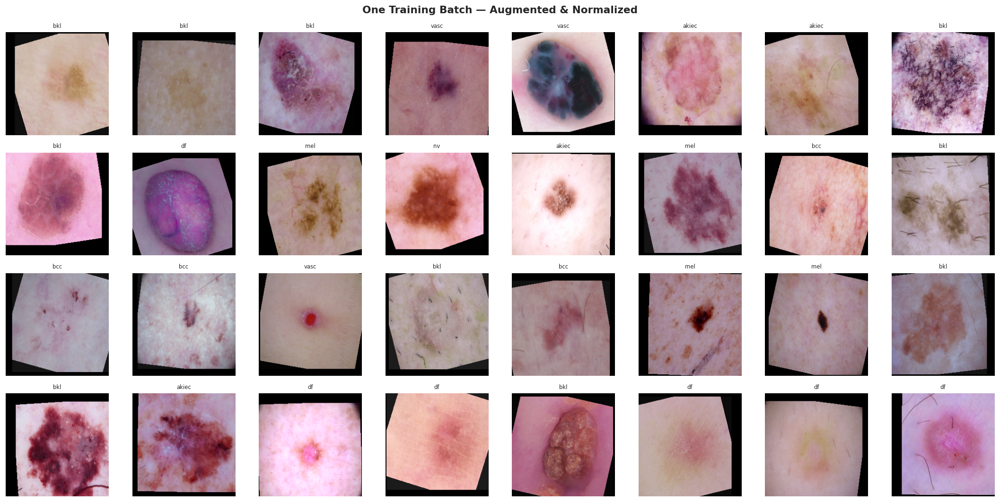

In [148]:
images, labels = next(iter(train_loader))

print(f'Batch image tensor shape : {images.shape}  (B, C, H, W)')
print(f'Batch label tensor shape : {labels.shape}')
print(f'Image dtype              : {images.dtype}')
print(f'Label dtype              : {labels.dtype}')
print(f'Pixel min / max          : {images.min():.3f} / {images.max():.3f}')
print(f'Labels in batch          : {labels.tolist()}')

# Show batch sample
fig, axes = plt.subplots(4, 8, figsize=(18, 9))
fig.suptitle('One Training Batch — Augmented & Normalized', fontsize=13, fontweight='bold')

for i, ax in enumerate(axes.flatten()):
    if i >= len(images):
        ax.axis('off')
        continue
    img = denormalize(images[i]).permute(1, 2, 0).numpy()
    ax.imshow(img)
    ax.set_title(IDX_TO_CLASS[labels[i].item()], fontsize=7)
    ax.axis('off')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'preprocessing_batch_sample.png', bbox_inches='tight')
plt.show()

### Save Processed dataframe

In [149]:
train_df.to_csv(OUTPUT_DIR / 'train.csv', index=False)
val_df.to_csv(  OUTPUT_DIR / 'val.csv',   index=False)
test_df.to_csv( OUTPUT_DIR / 'test.csv',  index=False)

# Save class mapping
import json
meta = {
    'class_to_idx'          : CLASS_TO_IDX,
    'idx_to_class'          : {str(k): v for k, v in IDX_TO_CLASS.items()},
    'class_names'           : CLASS_NAMES,
    'class_weights'         : class_weights_tensor.tolist(),
    'num_classes'           : NUM_CLASSES,
    'img_size'              : IMG_SIZE,
    'imagenet_mean'         : IMAGENET_MEAN,
    'imagenet_std'          : IMAGENET_STD,
}
with open(OUTPUT_DIR / 'dataset_meta.json', 'w') as f:
    json.dump(meta, f, indent=2)

print('Saved:')
for f in sorted(OUTPUT_DIR.iterdir()):
    size_kb = f.stat().st_size / 1024
    print(f'   {f.name:<40} {size_kb:>8.1f} KB')

Saved:
   .ipynb_checkpoints                            4.0 KB
   dataset_meta.json                             0.8 KB
   eda_age_distribution.png                     53.8 KB
   eda_class_distribution.png                   89.3 KB
   eda_duplicate_lesions.png                    25.2 KB
   eda_dx_type.png                              75.3 KB
   eda_image_sizes.png                          31.7 KB
   eda_localization.png                        137.0 KB
   eda_missing_values.png                       14.7 KB
   eda_pixel_channels.png                       49.0 KB
   eda_sample_images.png                      3273.0 KB
   eda_sex_distribution.png                     55.9 KB
   preprocessing_augmentation.png             1498.1 KB
   preprocessing_batch_sample.png             2076.0 KB
   preprocessing_class_weights.png              27.2 KB
   preprocessing_split_distribution.png         59.5 KB
   test.csv                                    106.4 KB
   train.csv                             

# Summary

In [150]:
print('═' * 60)
print('  HAM10000  —  EDA & PREPROCESSING COMPLETE')
print('═' * 60)
print(f'  Total images           : {len(df):,}')
print(f'  Train / Val / Test     : {len(train_df)} / {len(val_df)} / {len(test_df)}')
print(f'  Number of classes      : {NUM_CLASSES}')
print(f'  Image size             : {IMG_SIZE}×{IMG_SIZE}')
print(f'  Imbalance handled      : WeightedRandomSampler + ClassWeights')
print(f'  Split strategy         : By lesion_id (leak-free)')
print(f'  Augmentations          : Flip, Rotate, ColorJitter, Affine')
print(f'  Normalization          : ImageNet mean/std')
print('═' * 60)
print()
print('Outputs saved to:', OUTPUT_DIR.resolve())


════════════════════════════════════════════════════════════
  HAM10000  —  EDA & PREPROCESSING COMPLETE
════════════════════════════════════════════════════════════
  Total images           : 10,015
  Train / Val / Test     : 8020 / 1019 / 976
  Number of classes      : 7
  Image size             : 224×224
  Imbalance handled      : WeightedRandomSampler + ClassWeights
  Split strategy         : By lesion_id (leak-free)
  Augmentations          : Flip, Rotate, ColorJitter, Affine
  Normalization          : ImageNet mean/std
════════════════════════════════════════════════════════════

Outputs saved to: /home/hitman/python/Projects/Skin Cancer /outputs
